# 風格轉換(Neural Style Transfer)
### 程式修改自『Introduction to Neural Style Transfer with TensorFlow』
(https://towardsdatascience.com/introduction-to-neural-style-transfer-with-tensorflow-99915a5d624a)

In [28]:
# 載入相關套件
import os
import time
import sys
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.preprocessing.image import load_img
from tensorflow.keras.preprocessing.image import img_to_array

## 測試內容及風格損失的計算

In [12]:
# 定義計算內容損失的函數
def compute_content_cost(a_C, a_G):   
    # Retrieve dimensions from a_G
    m, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # 轉為二維
    a_C_unrolled = tf.reshape(a_C, shape=[m, n_H * n_W, n_C])
    a_G_unrolled = tf.reshape(a_G, shape=[m, n_H * n_W, n_C])
    
    # 計算內容損失
    J_content = tf.reduce_sum(tf.square(a_C_unrolled - a_G_unrolled)) / (4 * n_H * n_W * n_C)
    
    return J_content

In [3]:
# 測試
a_C = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
a_G = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
J_content = compute_content_cost(a_C, a_G)

print("J_content = " + str(J_content.numpy()))

J_content = 9.147212


## 計算 Gram Matrix

In [4]:
# 計算 Gram Matrix
def gram_matrix(A):
    return tf.matmul(A, tf.transpose(A))   

In [5]:
# 測試
A = tf.random.normal([3, 2*1], mean=1, stddev=4)
GA = gram_matrix(A)

print("GA = " + str(GA.numpy()))

GA = [[ 1.1021338  1.5830241  1.7583159]
 [ 1.5830241 12.492058  15.128589 ]
 [ 1.7583159 15.128589  18.349554 ]]


## 定義計算風格損失的函數

In [6]:
# 定義函數，計算單一神經層的風格損失
def compute_layer_style_cost(a_S, a_G):  
    # 取得生成圖像的像素
    m, n_H, n_W, n_C = a_G.get_shape().as_list()
    
    # # 轉為二維
    a_S = tf.reshape(a_S, [n_C, n_H * n_W])
    a_G = tf.reshape(a_G, [n_C, n_H * n_W])

    # 計算 gram matrices 
    GS = gram_matrix(a_S)
    GG = gram_matrix(a_G)

    # 計算風格損失
    J_style_layer = tf.reduce_sum(tf.square(GS - GG))/(4 * (n_C * n_W * n_H)**2)
    
    return J_style_layer

In [7]:
# 測試
a_S = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
a_G = tf.random.normal([1, 4, 4, 3], mean=1, stddev=4)
J_style_layer = compute_layer_style_cost(a_S, a_G)

print("J_style_layer = " + str(J_style_layer.numpy()))

J_style_layer = 22.941185


## 設定各卷積層權重

In [8]:
# 設定各卷積層權重
STYLE_LAYERS = [
    ('conv1_1', 0.2),
    ('conv2_1', 0.2),
    ('conv3_1', 0.2),
    ('conv4_1', 0.2),
    ('conv5_1', 0.2)]

In [9]:
# 計算所有神經層的風格損失
def compute_style_cost(model, STYLE_LAYERS):
    J_style = 0
    # 計算每一層的風格損失
    for layer_name, coeff in STYLE_LAYERS:
        # 取得每一層的生成圖像像素
        a_G = model[layer_name]
        
        # 計算單一神經層的風格損失
        J_style_layer = compute_layer_style_cost(a_S, a_G)

        # 累加風格損失
        J_style += coeff * J_style_layer

    return J_style

## 定義計算總損失函數

In [10]:
# 定義計算總損失函數
def total_cost(J_content, J_style, alpha = 10, beta = 40):    
    J = alpha * J_content + beta * J_style    
    return J

In [11]:
# 測試
J_content = np.random.randn()    
J_style = np.random.randn()
J = total_cost(J_content, J_style)
print("J = " + str(J))

J = -5.397341190096913


# 風格轉換(Neural Style Transfer)
### 程式修改自『TF2 Neural style transfer』
https://www.tensorflow.org/tutorials/generative/style_transfer

## 載入內容圖檔

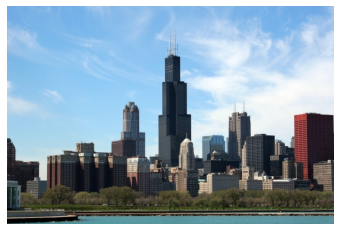

In [33]:
# 載入內容圖檔
content_path = "./style_transfer/chicago.jpg"
content_image = load_img(content_path)
plt.imshow(content_image)
plt.axis('off')
plt.show()

## 載入風格圖檔

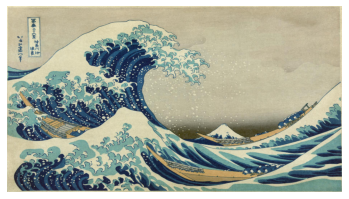

In [34]:
# 載入風格圖檔
style_path = "./style_transfer/wave.jpg"
style_image = load_img(style_path)
plt.imshow(style_image)
plt.axis('off')
plt.show()

## 將影像縮放為(512, 512)，並轉為(1, 512, 512, 3)陣列

In [46]:
from tensorflow.keras.applications.vgg19 import preprocess_input

def normalize_image(img):
    # 加一維
    x = img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = tf.image.resize(x, [512, 512])
    x = preprocess_input(x)
    
    return x.numpy()

content_array = normalize_image(content_image)
style_array = normalize_image(style_image)
content_array.shape

(1, 512, 512, 3)

In [26]:
def load_and_process_img(path_to_img):
    img = load_img(path_to_img)
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = tf.keras.applications.vgg19.preprocess_input(img)
    # print(img.shape)
    return img

In [5]:
def deprocess_img(processed_img):
    x = processed_img.copy()
    if len(x.shape) == 4:
        x = np.squeeze(x, 0)

    # perform the inverse of the preprocessing step
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    x = x[:, :, ::-1]

    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [6]:
# Content layer where will pull our feature maps
content_layers = ['block5_conv2'] 

# Style layer we are interested in
style_layers = ['block1_conv1',
                'block2_conv1',
                'block3_conv1', 
                'block4_conv1', 
                'block5_conv1'
               ]

num_content_layers = len(content_layers)
num_style_layers = len(style_layers)

In [21]:
from tensorflow.python.keras import models 

def get_model():
    """ Creates our model with access to intermediate layers. 
    
    This function will load the VGG19 model and access the intermediate layers. 
    These layers will then be used to create a new model that will take input image
    and return the outputs from these intermediate layers from the VGG model. 
    
    Returns:
        returns a keras model that takes image inputs and outputs the style and 
            content intermediate layers. 
    """
    # Load our model. We load pretrained VGG, trained on imagenet data
    vgg = tf.keras.applications.vgg19.VGG19(include_top=False, weights='imagenet')
    vgg.trainable = False
    # Get output layers corresponding to style and content layers 
    style_outputs = [vgg.get_layer(name).output for name in style_layers]
    content_outputs = [vgg.get_layer(name).output for name in content_layers]
    model_outputs = style_outputs + content_outputs
    # Build model 
    return models.Model(vgg.input, model_outputs)

In [8]:
def get_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

In [9]:
def gram_matrix(input_tensor):
    # We make the image channels first 
    channels = int(input_tensor.shape[-1])
    a = tf.reshape(input_tensor, [-1, channels])
    n = tf.shape(a)[0]
    gram = tf.matmul(a, a, transpose_a=True)
    return gram / tf.cast(n, tf.float32)

def get_style_loss(base_style, gram_target):
    """Expects two images of dimension h, w, c"""
    # height, width, num filters of each layer
    # We scale the loss at a given layer by the size of the feature map and the number of filters
    height, width, channels = base_style.get_shape().as_list()
    gram_style = gram_matrix(base_style)
    
    return tf.reduce_mean(tf.square(gram_style - gram_target))# / (4. * (channels ** 2) * (width * height) ** 2)

In [10]:
def get_feature_representations(model, content_path, style_path):
    """Helper function to compute our content and style feature representations.

    This function will simply load and preprocess both the content and style 
    images from their path. Then it will feed them through the network to obtain
    the outputs of the intermediate layers. 
    
    Arguments:
        model: The model that we are using.
        content_path: The path to the content image.
        style_path: The path to the style image
        
    Returns:
        returns the style features and the content features. 
    """
    # Load our images in 
    content_image = load_and_process_img(content_path)
    style_image = load_and_process_img(style_path)
    
    # batch compute content and style features
    style_outputs = model(style_image)
    content_outputs = model(content_image)
    
    
    # Get the style and content feature representations from our model    
    style_features = [style_layer[0] for style_layer in style_outputs[:num_style_layers]]
    content_features = [content_layer[0] for content_layer in content_outputs[num_style_layers:]]
    return style_features, content_features

In [11]:
def compute_loss(model, loss_weights, init_image, gram_style_features, content_features):
    """This function will compute the loss total loss.
    
    Arguments:
        model: The model that will give us access to the intermediate layers
        loss_weights: The weights of each contribution of each loss function. 
            (style weight, content weight, and total variation weight)
        init_image: Our initial base image. This image is what we are updating with 
            our optimization process. We apply the gradients wrt the loss we are 
            calculating to this image.
        gram_style_features: Precomputed gram matrices corresponding to the 
            defined style layers of interest.
        content_features: Precomputed outputs from defined content layers of 
            interest.
            
    Returns:
        returns the total loss, style loss, content loss, and total variational loss
    """
    style_weight, content_weight = loss_weights
    
    # Feed our init image through our model. This will give us the content and 
    # style representations at our desired layers. Since we're using eager
    # our model is callable just like any other function!
    model_outputs = model(init_image)
    
    style_output_features = model_outputs[:num_style_layers]
    content_output_features = model_outputs[num_style_layers:]
    
    style_score = 0
    content_score = 0

    # Accumulate style losses from all layers
    # Here, we equally weight each contribution of each loss layer
    weight_per_style_layer = 1.0 / float(num_style_layers)
    for target_style, comb_style in zip(gram_style_features, style_output_features):
        style_score += weight_per_style_layer * get_style_loss(comb_style[0], target_style)
        
    # Accumulate content losses from all layers 
    weight_per_content_layer = 1.0 / float(num_content_layers)
    for target_content, comb_content in zip(content_features, content_output_features):
        content_score += weight_per_content_layer* get_content_loss(comb_content[0], target_content)
    
    style_score *= style_weight
    content_score *= content_weight

    # Get total loss
    loss = style_score + content_score 
    return loss, style_score, content_score

In [12]:
def compute_grads(cfg):
    with tf.GradientTape() as tape: 
        all_loss = compute_loss(**cfg)
    # Compute gradients wrt input image
    total_loss = all_loss[0]
    return tape.gradient(total_loss, cfg['init_image']), all_loss

In [13]:
import IPython.display

def run_style_transfer(content_path, style_path, num_iterations=1000,
                         content_weight=1e3, style_weight=1e-2): 
    # We don't need to (or want to) train any layers of our model, so we set their
    # trainable to false. 
    model = get_model() 
    for layer in model.layers:
        layer.trainable = False
    
    # Get the style and content feature representations (from our specified intermediate layers) 
    style_features, content_features = get_feature_representations(model, content_path, style_path)
    gram_style_features = [gram_matrix(style_feature) for style_feature in style_features]
    
    # Set initial image
    init_image = load_and_process_img(content_path)
    init_image = tf.Variable(init_image, dtype=tf.float32)
    # Create our optimizer
    opt = tf.optimizers.Adam(learning_rate=5, beta_1=0.99, epsilon=1e-1)

    # For displaying intermediate images 
    iter_count = 1
    
    # Store our best result
    best_loss, best_img = float('inf'), None
    
    # Create a nice config 
    loss_weights = (style_weight, content_weight)
    cfg = {
            'model': model,
            'loss_weights': loss_weights,
            'init_image': init_image,
            'gram_style_features': gram_style_features,
            'content_features': content_features
    }
        
    # For displaying
    num_rows = 2
    num_cols = 5
    display_interval = num_iterations/(num_rows*num_cols)
    start_time = time.time()
    global_start = time.time()
    
    norm_means = np.array([103.939, 116.779, 123.68])
    min_vals = -norm_means
    max_vals = 255 - norm_means     
    
    imgs = []
    for i in range(num_iterations):
        grads, all_loss = compute_grads(cfg)
        loss, style_score, content_score = all_loss
        opt.apply_gradients([(grads, init_image)])
        clipped = tf.clip_by_value(init_image, min_vals, max_vals)
        init_image.assign(clipped)
        end_time = time.time() 
        
        if loss < best_loss:
            # Update best loss and best image from total loss. 
            best_loss = loss
            best_img = deprocess_img(init_image.numpy())

        if i % display_interval== 0:
            start_time = time.time()
            
            # Use the .numpy() method to get the concrete numpy array
            plot_img = init_image.numpy()
            plot_img = deprocess_img(plot_img)
            imgs.append(plot_img)
            # IPython.display.clear_output(wait=True)
            IPython.display.display_png(Image.fromarray(plot_img))
            print('Iteration: {}'.format(i))                
            print('Total loss: {:.2e}, ' 
                        'style loss: {:.2e}, '
                        'content loss: {:.2e}, '
                        'time: {:.2f}s'.format(loss, style_score, content_score, time.time() - start_time))
    print('Total time: {:.2f}s'.format(time.time() - global_start))
    # IPython.display.clear_output(wait=True)
    plt.figure(figsize=(14,4))
    for i,img in enumerate(imgs):
            plt.subplot(num_rows,num_cols,i+1)
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
            
    return best_img, best_loss 

(1, 474, 712, 3)
(1, 514, 928, 3)
(1, 474, 712, 3)


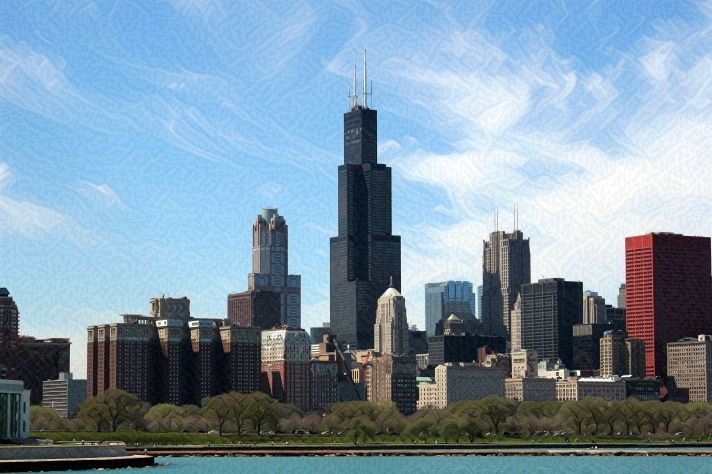

Iteration: 0
Total loss: 1.70e+08, style loss: 1.70e+08, content loss: 0.00e+00, time: 0.14s


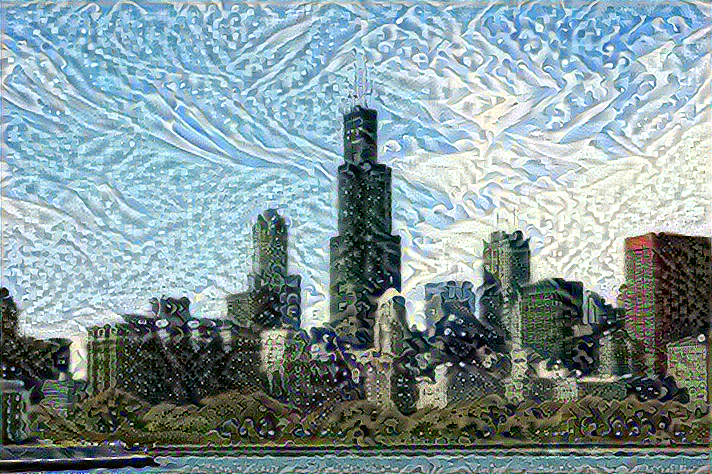

Iteration: 50
Total loss: 9.72e+06, style loss: 7.52e+06, content loss: 2.21e+06, time: 0.08s


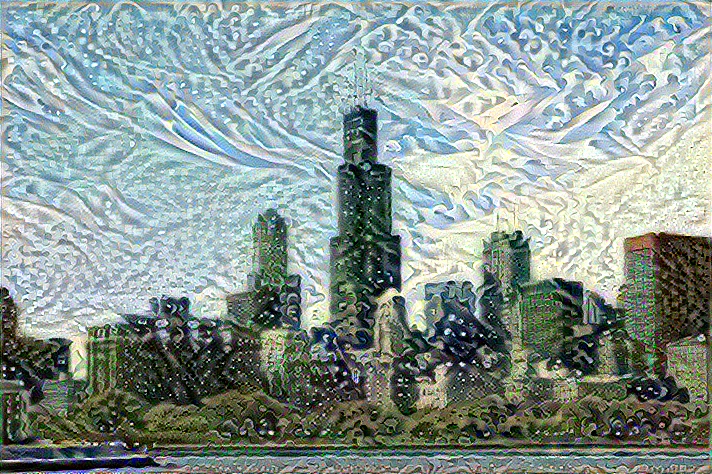

Iteration: 100
Total loss: 5.80e+06, style loss: 3.93e+06, content loss: 1.87e+06, time: 0.08s


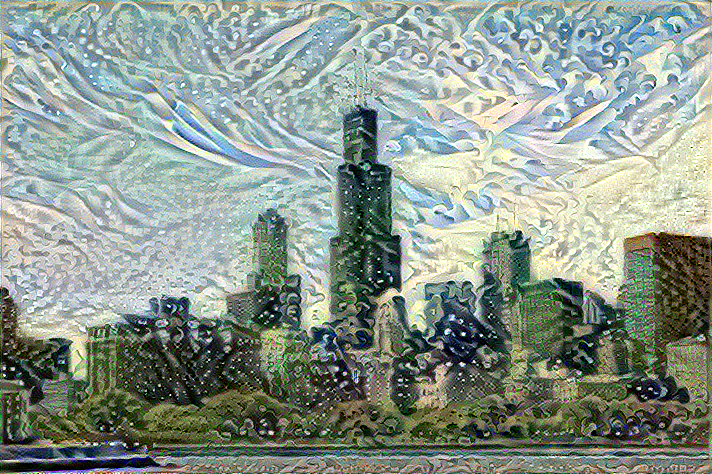

Iteration: 150
Total loss: 3.80e+06, style loss: 2.26e+06, content loss: 1.54e+06, time: 0.07s


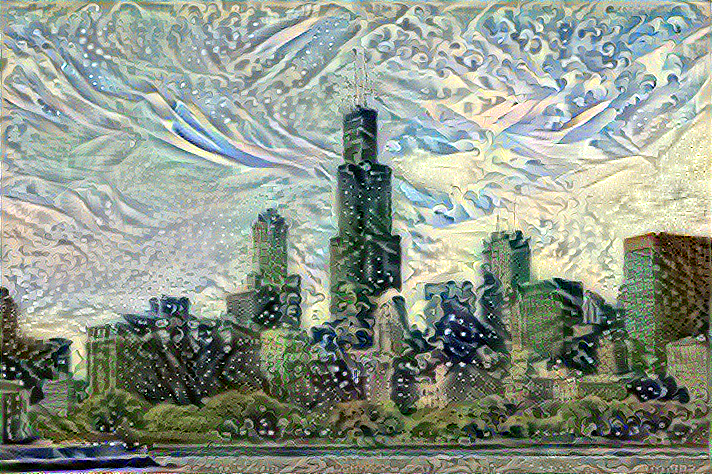

Iteration: 200
Total loss: 2.71e+06, style loss: 1.42e+06, content loss: 1.30e+06, time: 0.08s


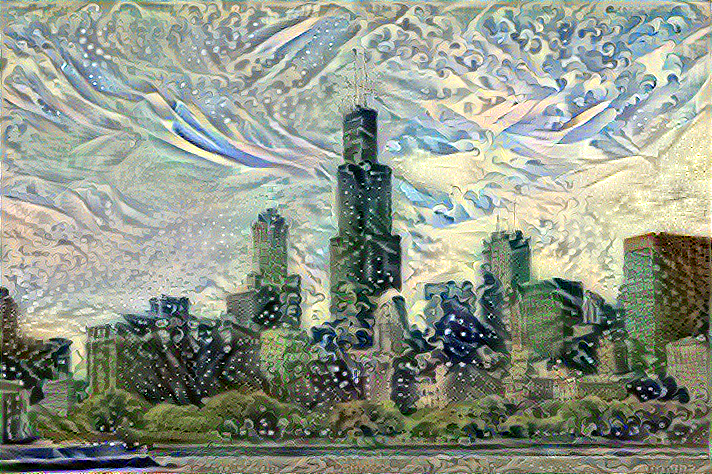

Iteration: 250
Total loss: 2.08e+06, style loss: 9.79e+05, content loss: 1.10e+06, time: 0.07s


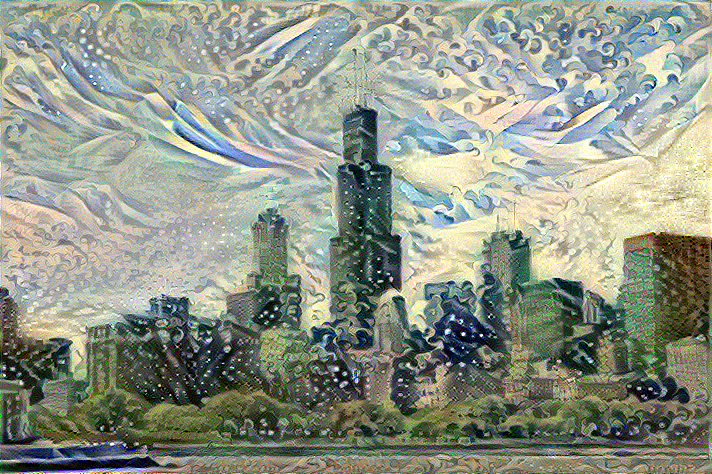

Iteration: 300
Total loss: 1.70e+06, style loss: 7.35e+05, content loss: 9.62e+05, time: 0.07s


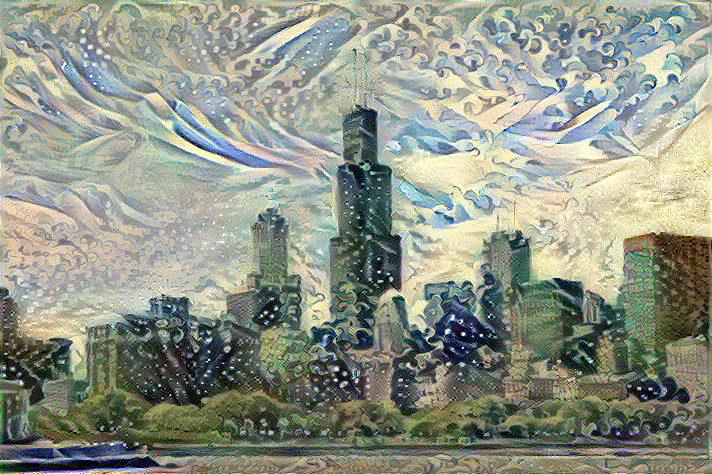

Iteration: 350
Total loss: 1.44e+06, style loss: 5.87e+05, content loss: 8.54e+05, time: 0.07s


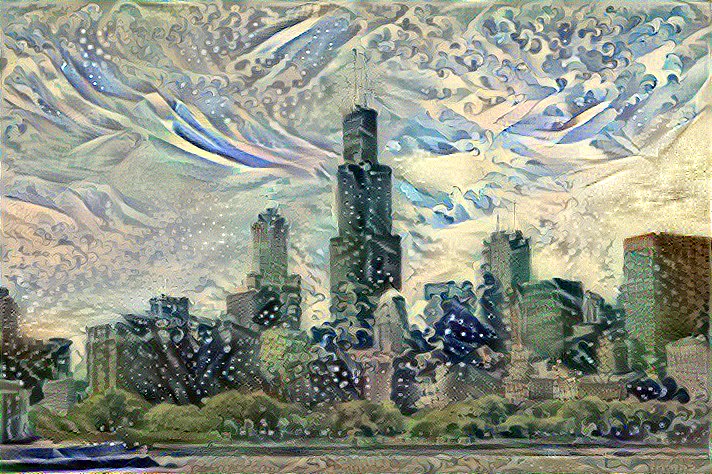

Iteration: 400
Total loss: 1.26e+06, style loss: 4.91e+05, content loss: 7.71e+05, time: 0.07s


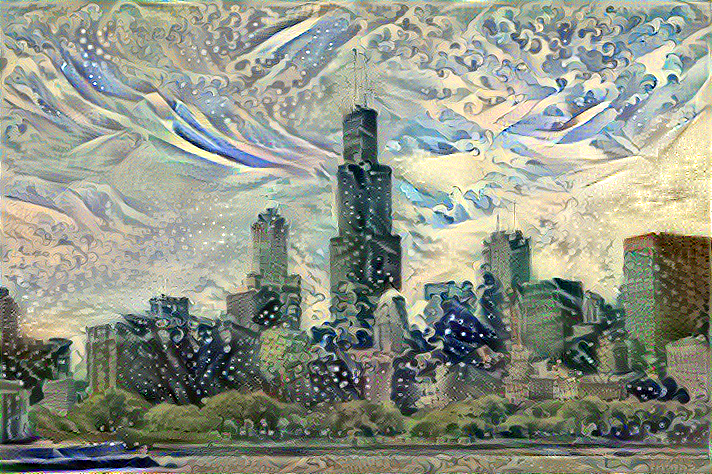

Iteration: 450
Total loss: 1.13e+06, style loss: 4.22e+05, content loss: 7.09e+05, time: 0.07s
Total time: 246.08s


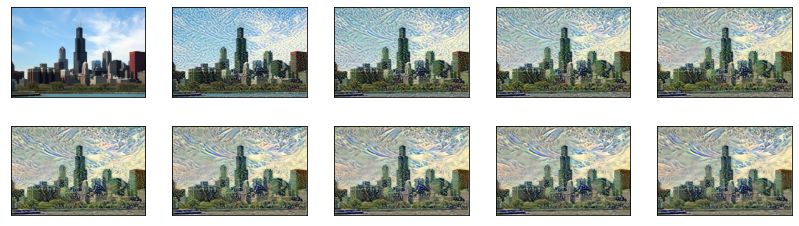

In [29]:
model = get_model()
best, best_loss = run_style_transfer(content_path, 
                                 style_path, num_iterations=500)

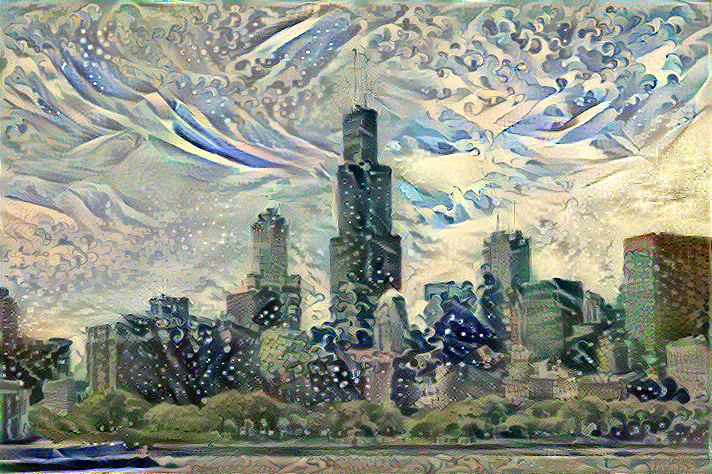

In [30]:
Image.fromarray(best)

In [39]:
def show_results(best_img, content_path, style_path, show_large_final=True):
    plt.figure(figsize=(10, 5))
    content = load_img(content_path) 
    style = load_img(style_path)

    plt.subplot(1, 2, 1)
    plt.axis('off')
    plt.imshow(content)
    plt.title('原圖')
 
    plt.subplot(1, 2, 2)
    plt.axis('off')
    plt.imshow(style)
    plt.title('風格圖')

    if show_large_final: 
        plt.figure(figsize=(10, 10))
        plt.axis('off')

        plt.imshow(best_img)
        plt.title('Output Image')
        plt.show()

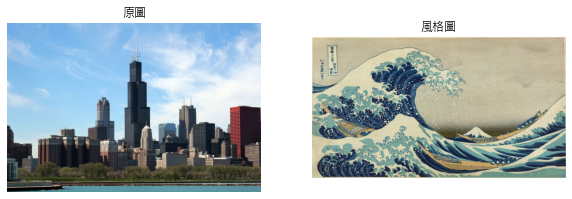

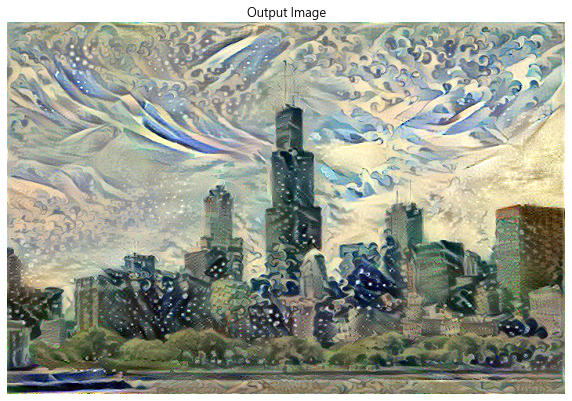

In [40]:
show_results(best, content_path, style_path)

In [ ]:
best_starry_night, best_loss = run_style_transfer('./chicago.jpg', './wave.jpg')

In [ ]:
show_results(best_starry_night, './chicago.jpg', './wave.jpg')

## 使用 tensorflow hub 的 Neural style transfer 預先訓練模型
https://www.tensorflow.org/tutorials/generative/style_transfer

In [41]:
# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [42]:
content_path = tf.keras.utils.get_file('YellowLabradorLooking_new.jpg', 'https://storage.googleapis.com/download.tensorflow.org/example_images/YellowLabradorLooking_new.jpg')
style_path = tf.keras.utils.get_file('kandinsky5.jpg','https://storage.googleapis.com/download.tensorflow.org/example_images/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg')

196608/195196 [==============================] - 0s 0us/step


In [48]:
def custom_load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

In [50]:
def custom_imshow(image, title=None):
    if len(image.shape) > 3:
        image = tf.squeeze(image, axis=0)

    plt.axis('off')
    plt.imshow(image)
    if title:
        plt.title(title)

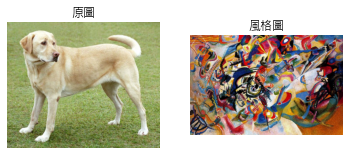

In [51]:
content_image = custom_load_img(content_path)
style_image = custom_load_img(style_path)

plt.subplot(1, 2, 1)
custom_imshow(content_image, '原圖')

plt.subplot(1, 2, 2)
custom_imshow(style_image, '風格圖')

In [52]:
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

In [53]:
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')
stylized_image = hub_model(tf.constant(content_image), tf.constant(style_image))[0]


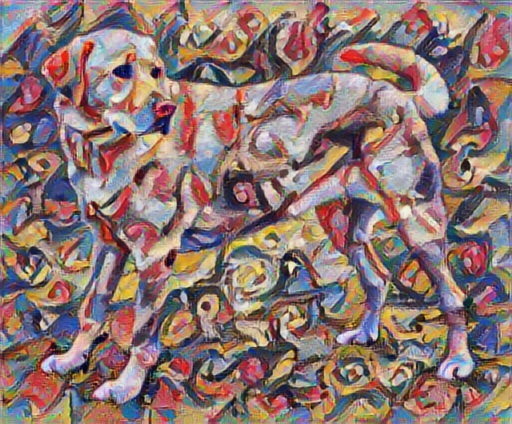

In [54]:
tensor_to_image(stylized_image)